In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa import stattools
from statsmodels.graphics import correlation
from src.data import get_all_data, multiclass_labels
from src.supervised_data import get_dataset
from context_printer import ContextPrinter as Ctp
from sklearn.decomposition import PCA

### Part 1: Understanding the dataset

Note that this can be used for feature selection for the binary classifier model that uses both benign and attack data in training, but it cannot be used for the autoencoder that should only use benign data to train (because these correlations are computed using benign and attack data).

In [2]:
data = get_all_data(color='dark_yellow')

Reading data
█ [1/9] Data from Danmini_Doorbell
█ [2/9] Data from Ecobee_Thermostat
█ [3/9] Data from Ennio_Doorbell
█ [4/9] Data from Philips_B120N10_Baby_Monitor
█ [5/9] Data from Provision_PT_737E_Security_Camera
█ [6/9] Data from Provision_PT_838_Security_Camera
█ [7/9] Data from Samsung_SNH_1011_N_Webcam
█ [8/9] Data from SimpleHome_XCS7_1002_WHT_Security_Camera
█ [9/9] Data from SimpleHome_XCS7_1003_WHT_Security_Camera


In [3]:
binary_dataset = get_dataset(data, multiclass=False)
binary_labels = binary_dataset[:][1].numpy()
features = binary_dataset[:][0].numpy()

In [4]:
unique, counts = np.unique(binary_labels, return_counts=True)
print("Number of benign instances: {}".format(counts[0]))
print("Number of attack instances: {}".format(counts[1]))

Number of benign instances: 555932
Number of attack instances: 6506674


As we can see we have roughly 10 times more attack data than benign data.

We now want to see how each feature seems to be affected by the label. For that we plot the coevolution of each feature with the label (115 plots).

In [5]:
color_label = 'red'
color_features = 'blue'
color_components = 'green'

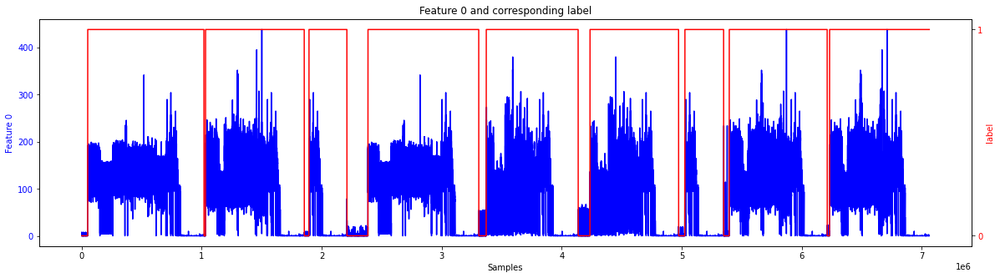

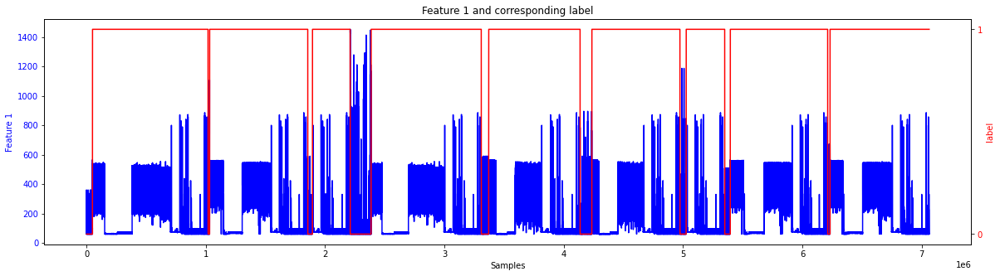

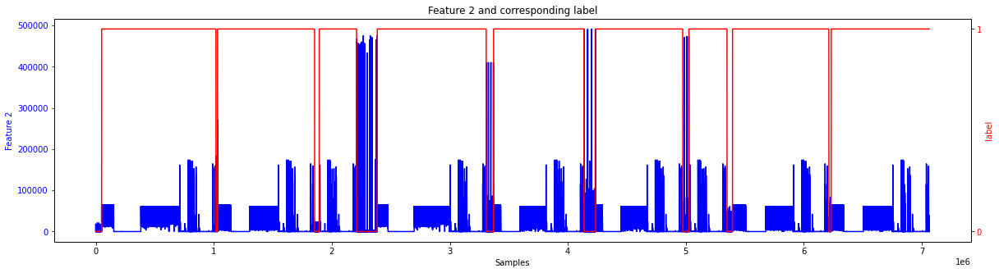

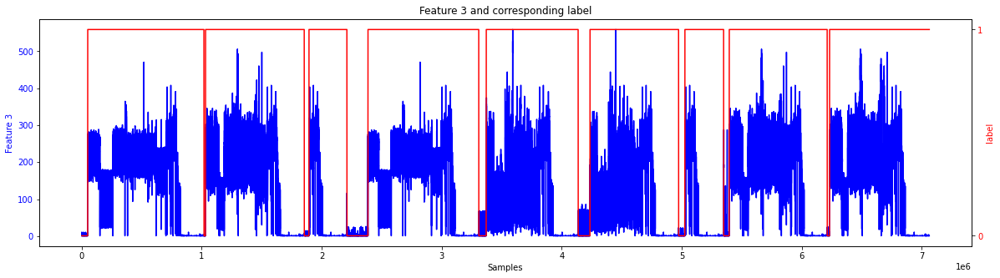

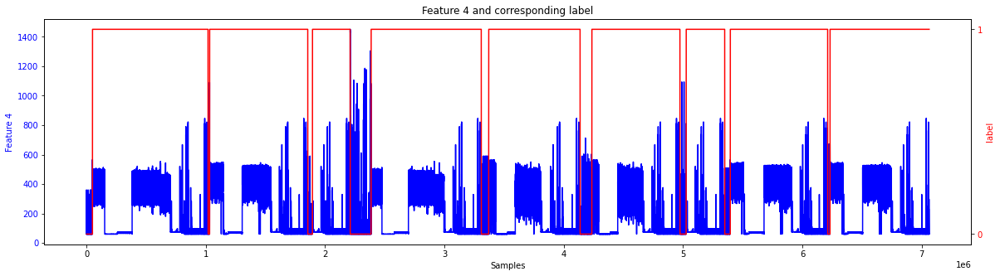

...

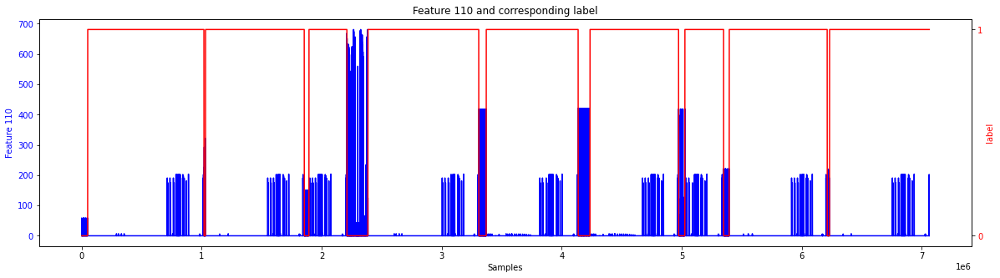

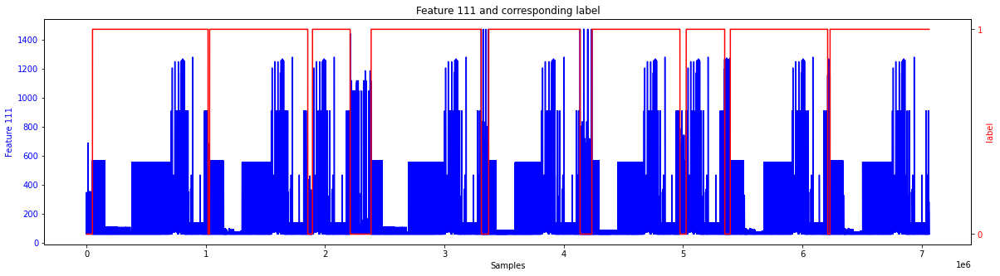

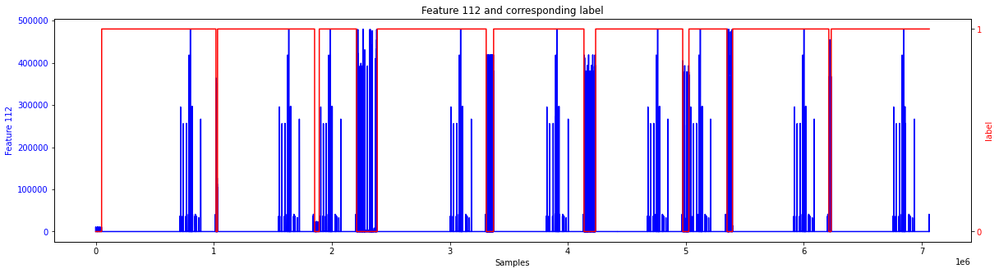

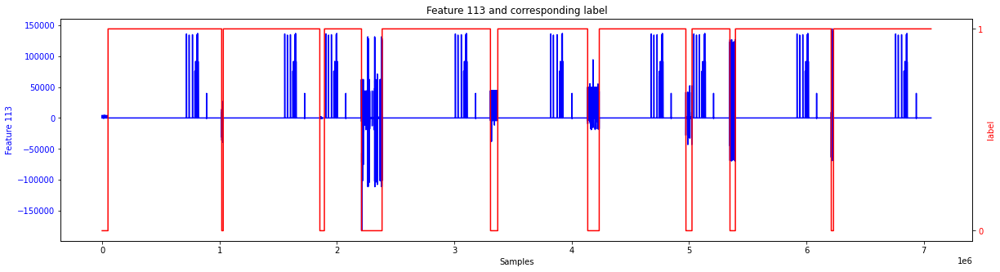

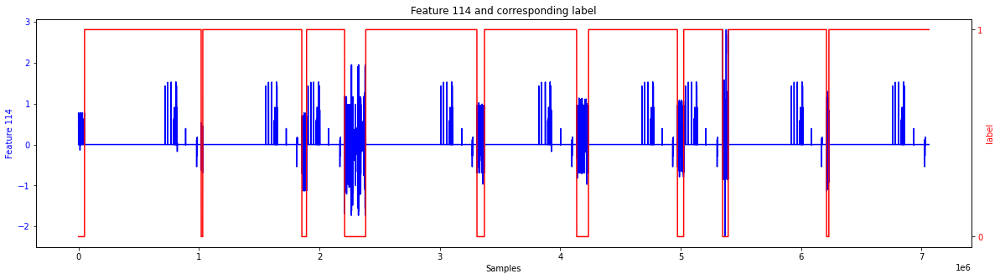

In [6]:
for feature_id in range(features.shape[1]):
    fig, ax1 = plt.subplots(figsize=(20, 5), gridspec_kw={'hspace': 0.5})
    ax1.set_title('Feature {} and corresponding label'.format(feature_id))
    ax1.set_xlabel('Samples')

    color = 'blue'
    ax1.set_ylabel('Feature {}'.format(feature_id), color=color_features)
    ax1.plot(features[:, feature_id], color=color_features)
    ax1.tick_params(axis='y', labelcolor=color_features)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    color = 'red'
    ax2.set_ylabel('label', color=color_label)
    ax2.plot(binary_labels, color=color_label)
    ax2.yaxis.set_ticks([0, 1])
    ax2.tick_params(axis='y', labelcolor=color_label)
    plt.show()

### Part 2: Correlation between each feature and the label

In [7]:
abs_correlations = []
for i in range(features.shape[1]):
    abs_correlations.append(np.abs(np.corrcoef(features[:, i], binary_labels, rowvar=False)[0, 1]))

sorted_abs_correlations = np.sort(abs_correlations)[::-1]

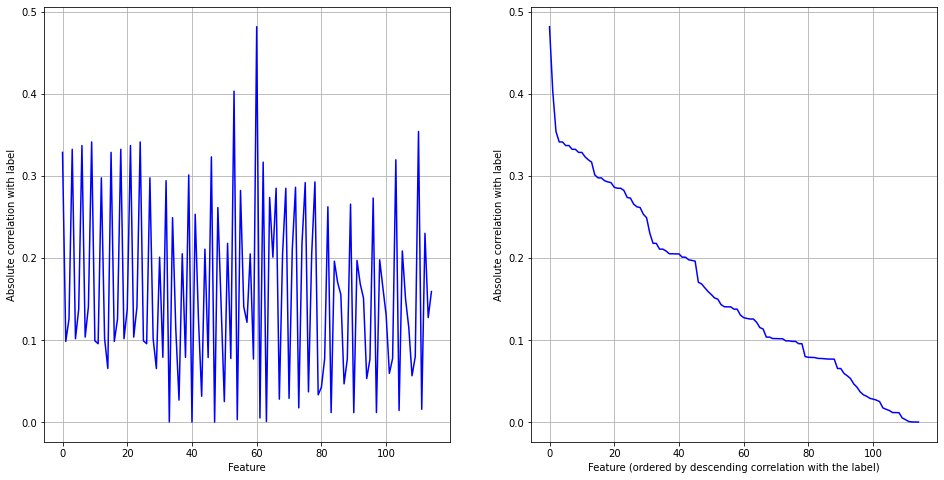

In [8]:
fig, axs = plt.subplots(1, 2, figsize=(16, 8))
axs[0].set_ylabel("Absolute correlation with label")
axs[0].set_xlabel("Feature")
axs[0].grid()
axs[0].plot(abs_correlations, color=color_features)

axs[1].set_ylabel("Absolute correlation with label")
axs[1].set_xlabel("Feature (ordered by descending correlation with the label)")
axs[1].grid()
axs[1].plot(sorted_abs_correlations, color=color_features)

plt.show()

### Part 3: PCA

Before computing the PCA, we normalize the data.

In [9]:
means = features.mean(axis=0, dtype=np.float64)
stds = features.std(axis=0, dtype=np.float64)
normalized_features = (features - means) / stds

In [10]:
pca = PCA(n_components=115)

In [11]:
pca.fit(normalized_features)

PCA(n_components=115)

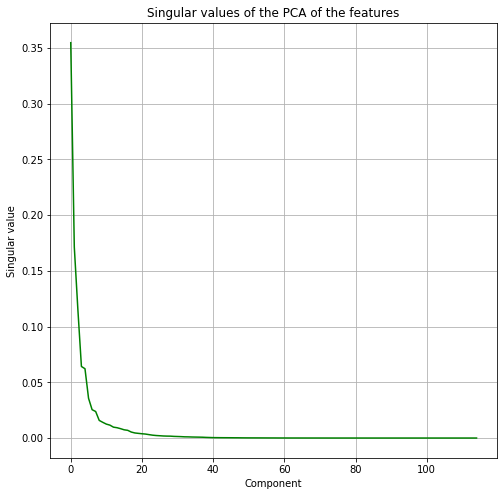

In [12]:
fig, ax = plt.subplots(figsize=(8, 8))
ax.grid()
ax.set_title("Singular values of the PCA of the features")
ax.set_ylabel("Singular value")
ax.set_xlabel("Component")
ax.plot(pca.explained_variance_ratio_, color=color_components)
plt.show()

In [13]:
components = pca.transform(features)
components.shape

(7062606, 115)

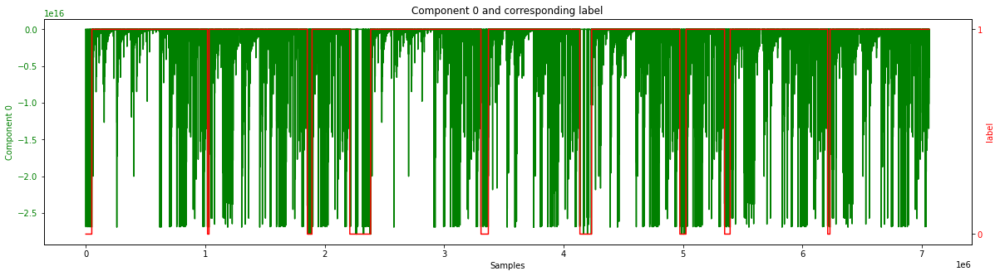

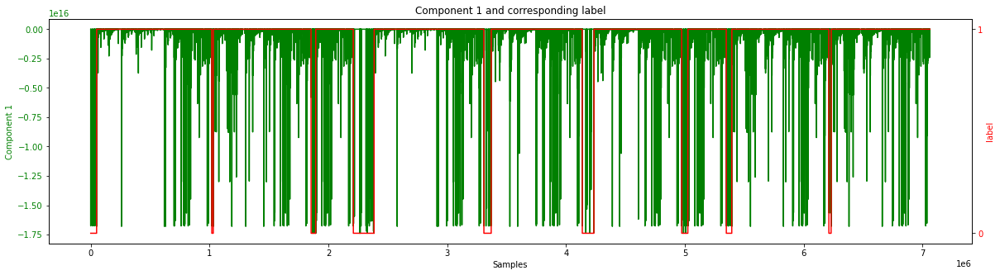

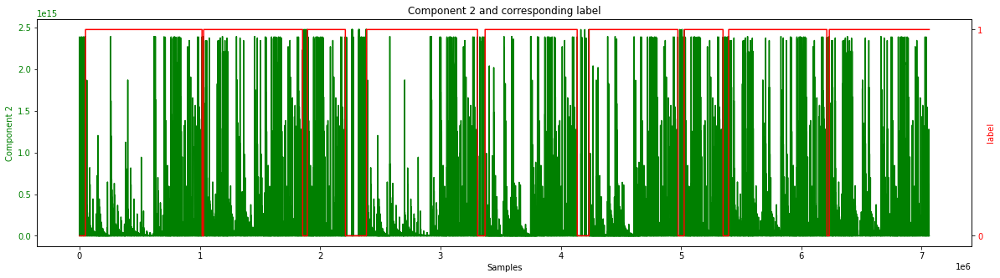

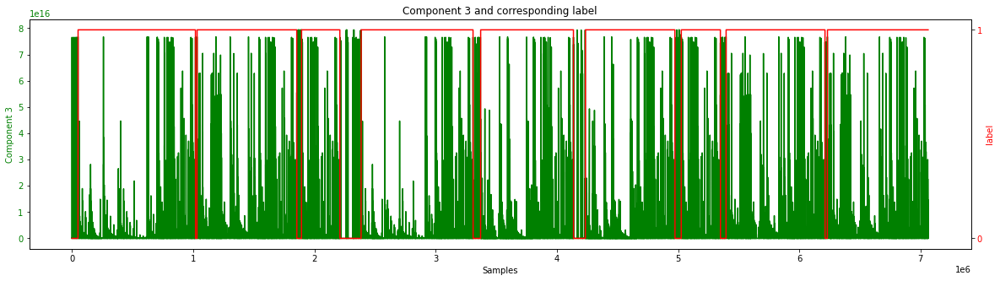

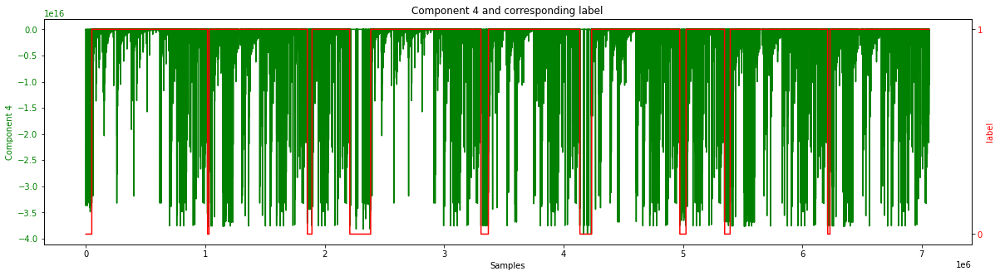

...

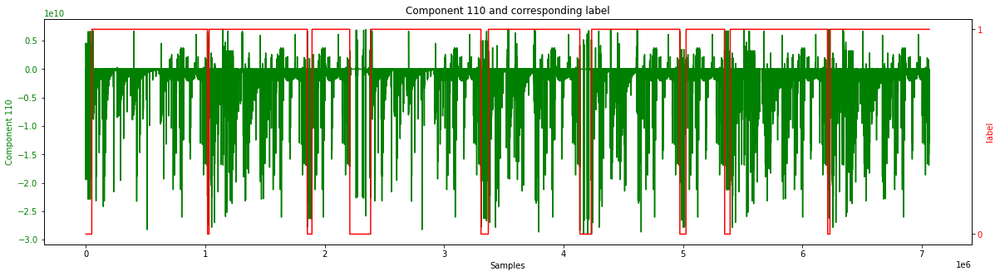

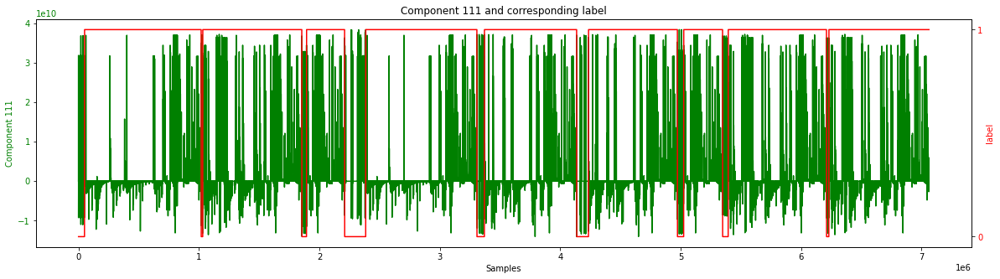

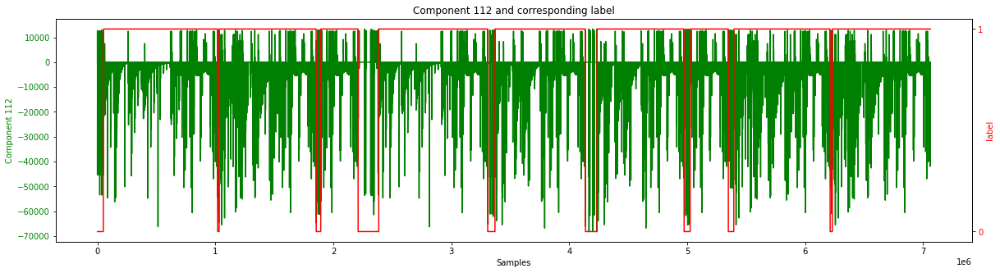

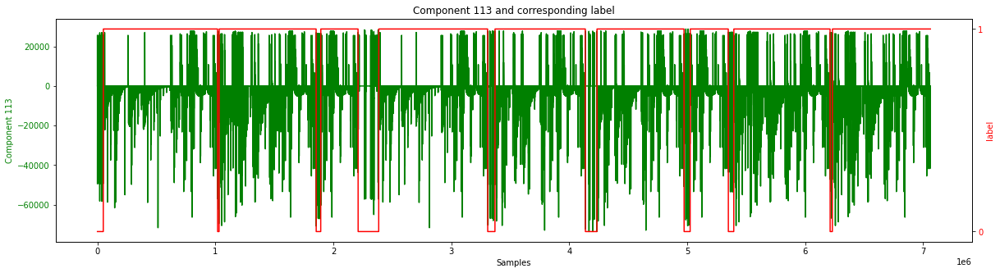

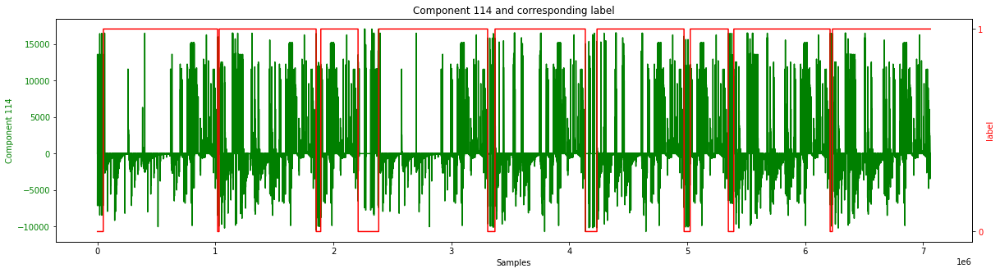

In [14]:
for feature_id in range(components.shape[1]):
    fig, ax1 = plt.subplots(figsize=(20, 5), gridspec_kw={'hspace': 0.5})
    ax1.set_title('Component {} and corresponding label'.format(feature_id))
    ax1.set_xlabel('Samples')

    ax1.set_ylabel('Component {}'.format(feature_id), color=color_components)
    ax1.plot(components[:, feature_id], color=color_components)
    ax1.tick_params(axis='y', labelcolor=color_components)

    ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

    ax2.set_ylabel('label', color=color_label)
    ax2.plot(binary_labels, color=color_label)
    ax2.yaxis.set_ticks([0, 1])
    ax2.tick_params(axis='y', labelcolor=color_label)
    plt.show()

In [15]:
abs_component_correlations = []
for i in range(components.shape[1]):
    abs_component_correlations.append(np.abs(np.corrcoef(components[:, i], binary_labels, rowvar=False)[0, 1]))

sorted_abs_component_correlations = np.sort(abs_component_correlations)[::-1]

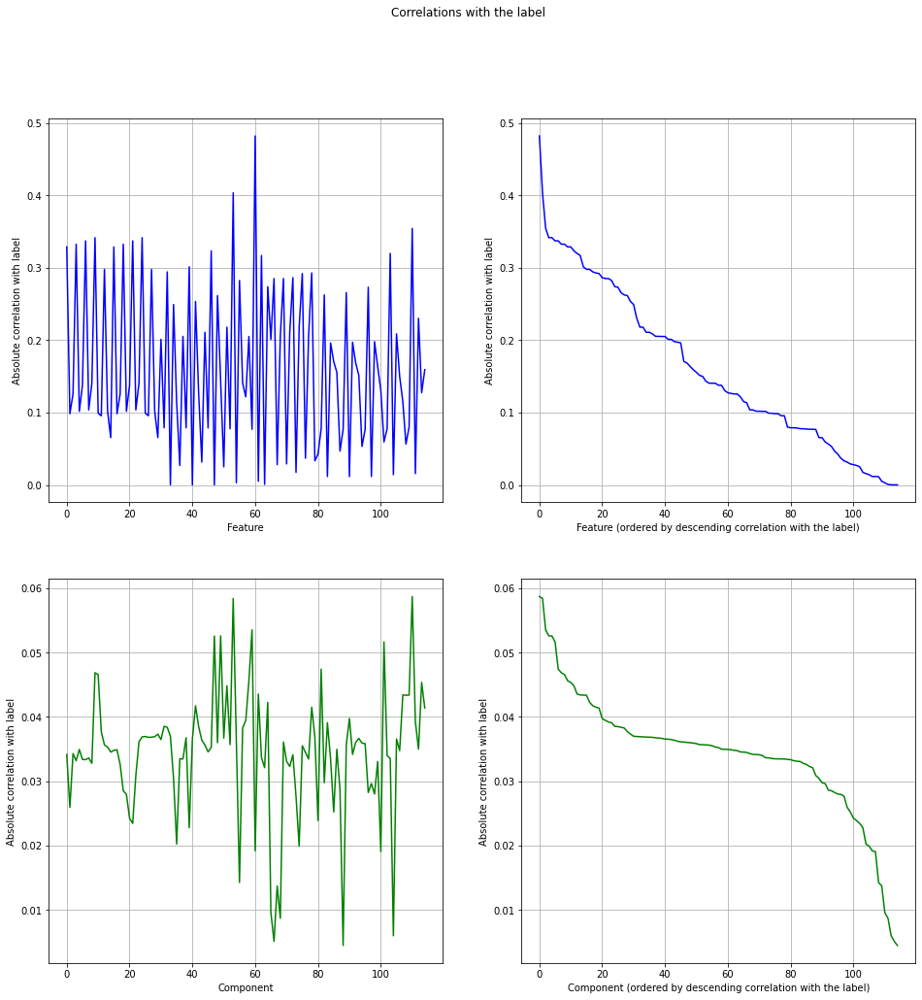

In [16]:
fig, axs = plt.subplots(2, 2, figsize=(16, 16))
fig.suptitle('Correlations with the label')

axs[0, 0].set_ylabel("Absolute correlation with label")
axs[0, 0].set_xlabel("Feature")
axs[0, 0].grid()
axs[0, 0].plot(abs_correlations, color=color_features)

axs[0, 1].set_ylabel("Absolute correlation with label")
axs[0, 1].set_xlabel("Feature (ordered by descending correlation with the label)")
axs[0, 1].grid()
axs[0, 1].plot(sorted_abs_correlations, color=color_features)

axs[1, 0].set_ylabel("Absolute correlation with label")
axs[1, 0].set_xlabel("Component")
axs[1, 0].grid()
axs[1, 0].plot(abs_component_correlations, color=color_components)

axs[1, 1].set_ylabel("Absolute correlation with label")
axs[1, 1].set_xlabel("Component (ordered by descending correlation with the label)")
axs[1, 1].grid()
axs[1, 1].plot(sorted_abs_component_correlations, color=color_components)

plt.show()

It seems like the PCA reduced the absolute correlation with the label by about a factor of 10. For that reason, PCA might not be a suitable dimensionality reduction method for the binary classification problem.

### Part 4: autocorrelation of the features

In [18]:
max_lengths = [0 for _ in range(115)]
for device_id in range(9):
    for key, features in data[device_id].items():
        for i, feature in enumerate(features.T):
            max_lengths[i] = max(max_lengths[i], len(feature))

acf_sum = [np.zeros(max_lengths[i]) for i in range(115)]
counts = [np.zeros(max_lengths[i]) for i in range(115)]
for device_id in range(9):
    print('Computing autocorrelations for device {}'.format(device_id + 1))
    for key, features in data[device_id].items():
        for i, feature in enumerate(features.T):
            acf = stattools.acf(feature, nlags=len(feature), fft=True)
            # For some features, the variance can be 0 for some keys, leading to nans in the acf.
            # We just skip those.
            if np.isnan(acf).sum() == 0:
                weights = np.arange(len(feature))[::-1] + 1
                counts[i][:len(feature)] += weights
                acf_sum[i][:len(feature)] += acf * weights

acfs = [acf_sum[i] / counts[i] for i in range(115)] # If a count is equal to 0 we get a nan

Computing autocorrelations for device 1


/home/valerian/venvs/venv1/lib/python3.8/site-packages/statsmodels/tsa/stattools.py:677: RuntimeWarning: invalid value encountered in true_divide
  acf = avf[: nlags + 1] / avf[0]


Computing autocorrelations for device 2
Computing autocorrelations for device 3
Computing autocorrelations for device 4
Computing autocorrelations for device 5
Computing autocorrelations for device 6
Computing autocorrelations for device 7
Computing autocorrelations for device 8
Computing autocorrelations for device 9


<ipython-input-18-bf7bef093dcd>:21: RuntimeWarning: invalid value encountered in true_divide
  acfs = [acf_sum[i] / counts[i] for i in range(115)] # If a count is equal to 0 we get a nan


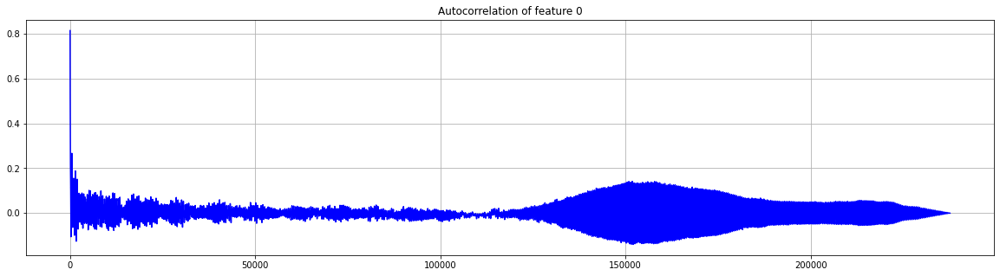

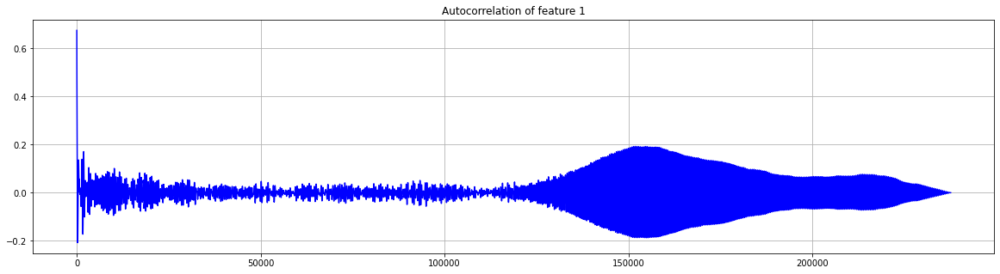

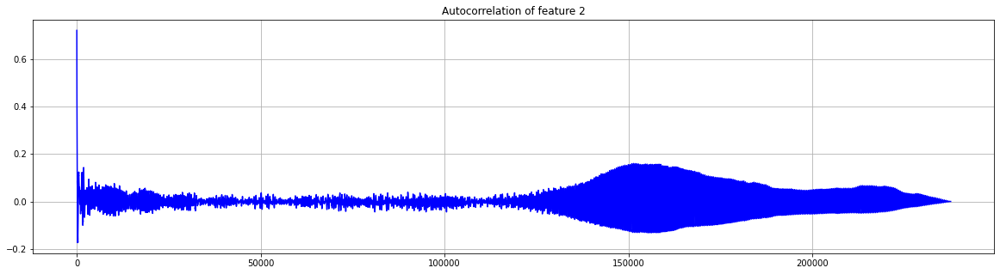

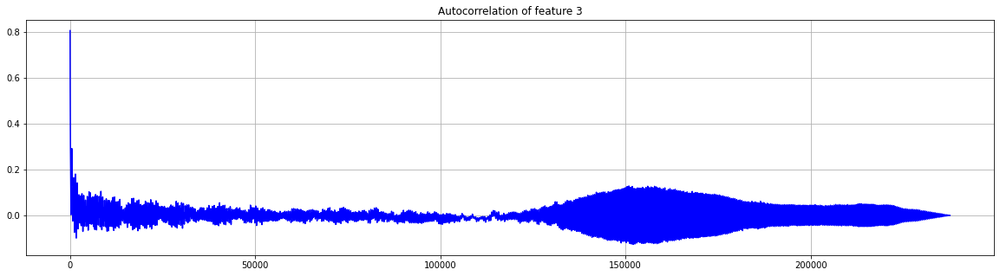

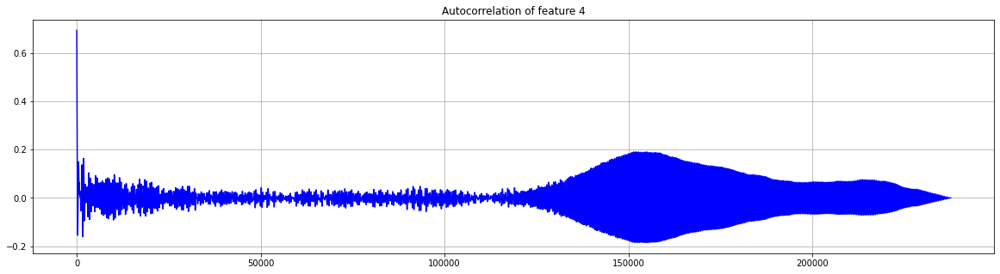

...

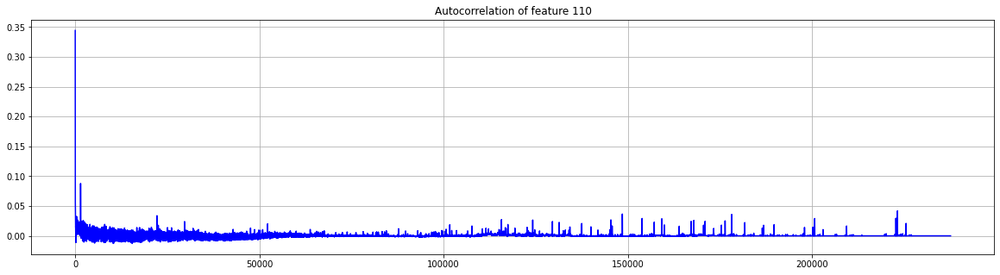

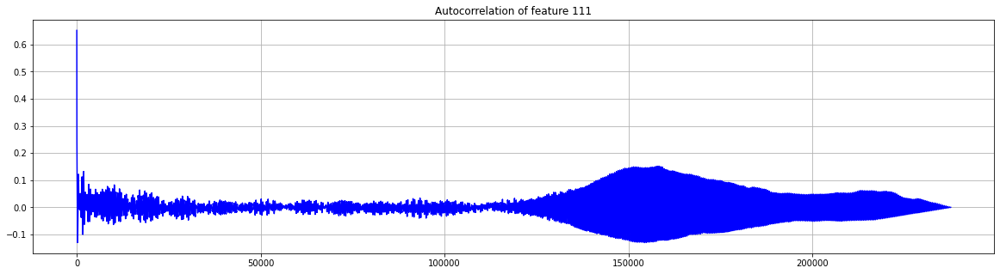

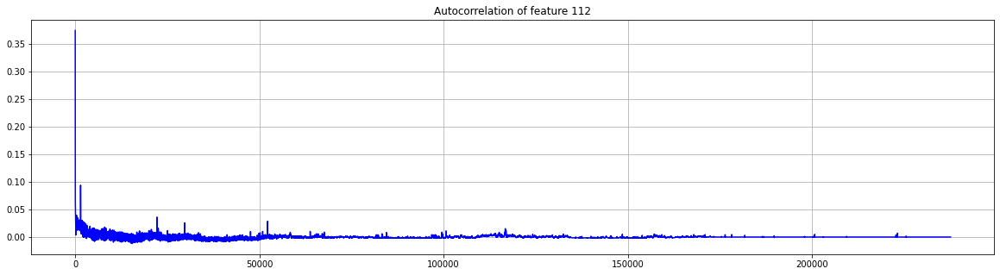

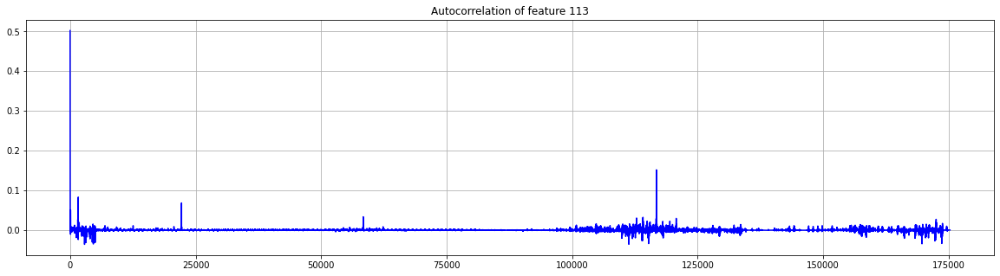

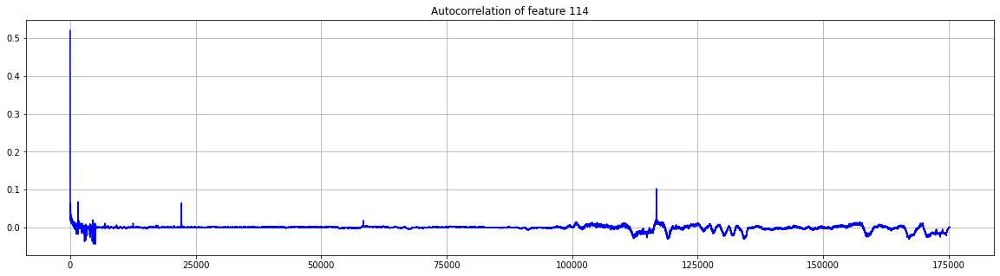

In [19]:
for feature_id in range(115):
    fig, ax = plt.subplots(figsize=(20, 5))
    ax.set_title("Autocorrelation of feature {}".format(feature_id))
    ax.plot(acfs[feature_id][1:], color=color_features)
    ax.grid()
    plt.show()

In [20]:
mean_abs_acf = np.nanmean(np.abs(np.array(acfs)), axis=0)

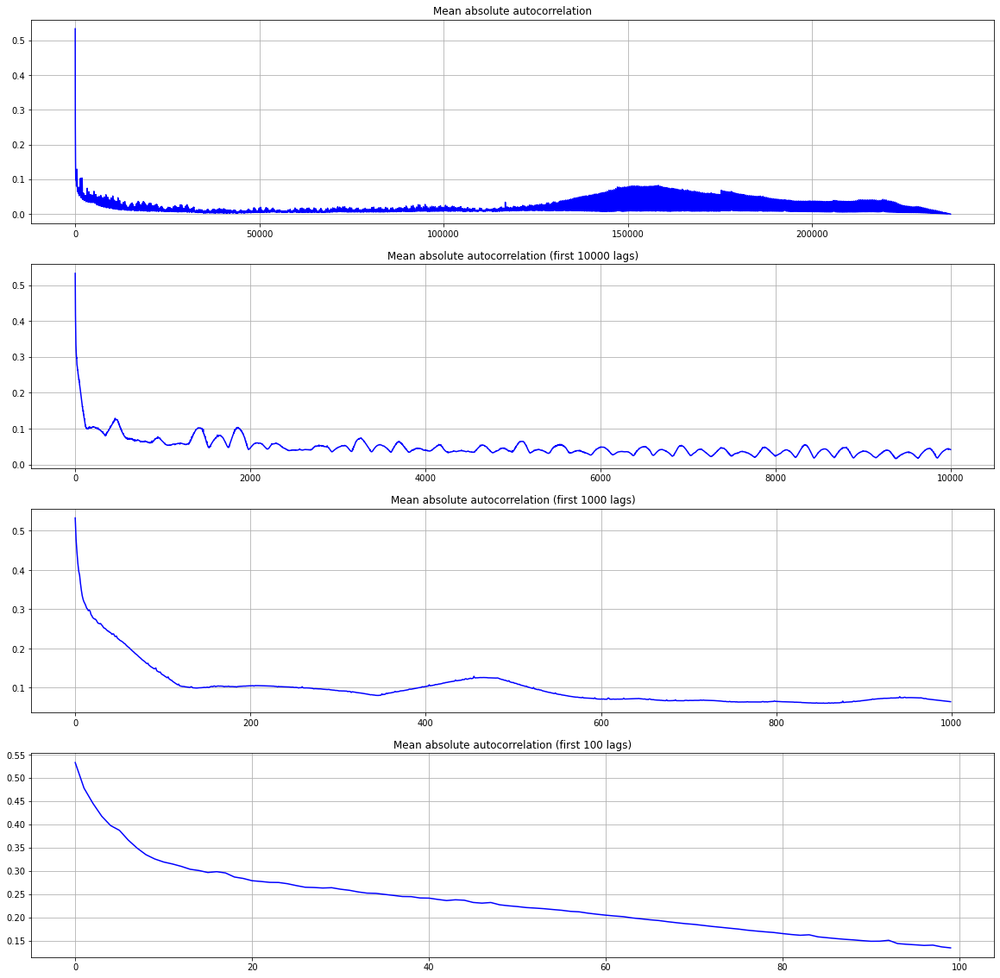

In [21]:
fig, axs = plt.subplots(4, figsize=(20, 20))
axs[0].set_title("Mean absolute autocorrelation")
axs[0].plot(mean_abs_acf[1:], color=color_features)
axs[0].grid()

axs[1].set_title("Mean absolute autocorrelation (first 10000 lags)")
axs[1].plot(mean_abs_acf[1:10001], color=color_features)
axs[1].grid()

axs[2].set_title("Mean absolute autocorrelation (first 1000 lags)")
axs[2].plot(mean_abs_acf[1:1001], color=color_features)
axs[2].grid()

axs[3].set_title("Mean absolute autocorrelation (first 100 lags)")
axs[3].plot(mean_abs_acf[1:101], color=color_features)
axs[3].grid()
plt.show()

It seems that the features are highly autocorrelated, even at very big lags. This is a problem, because it means that the test set will not be independent with the train set.

Now we can do the same but considering only benign data (to understand if the problem is the same for the autoencoder (anomaly detection approach).

In [22]:
max_lengths = [0 for _ in range(115)]
for device_id in range(9):
    features = data[device_id]["benign"]
    for i, feature in enumerate(features.T):
        max_lengths[i] = max(max_lengths[i], len(feature))

acf_sum = [np.zeros(max_lengths[i]) for i in range(115)]
counts = [np.zeros(max_lengths[i]) for i in range(115)]
for device_id in range(9):
    print('Computing autocorrelations for device {}'.format(device_id + 1))
    features = data[device_id]["benign"]
    for i, feature in enumerate(features.T):
        acf = stattools.acf(feature, nlags=len(feature), fft=True)
        # For some features, the variance can be 0 for some keys, leading to nans in the acf.
        # We just skip those.
        if np.isnan(acf).sum() == 0:
            weights = np.arange(len(feature))[::-1] + 1
            counts[i][:len(feature)] += weights
            acf_sum[i][:len(feature)] += acf * weights
            
acfs = [acf_sum[i] / counts[i] for i in range(115)] # If a count is equal to 0 we get a nan

Computing autocorrelations for device 1
Computing autocorrelations for device 2
Computing autocorrelations for device 3
Computing autocorrelations for device 4
Computing autocorrelations for device 5
Computing autocorrelations for device 6
Computing autocorrelations for device 7
Computing autocorrelations for device 8
Computing autocorrelations for device 9


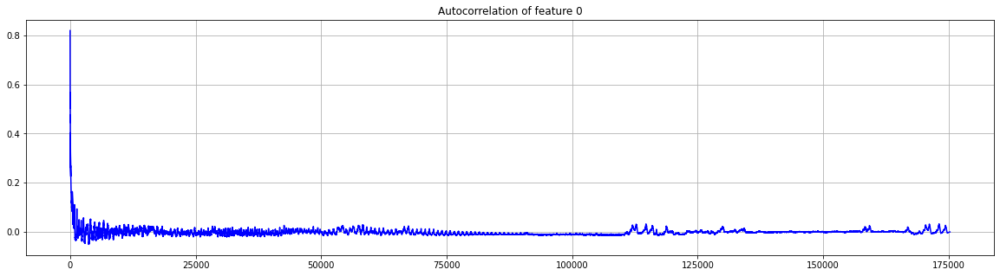

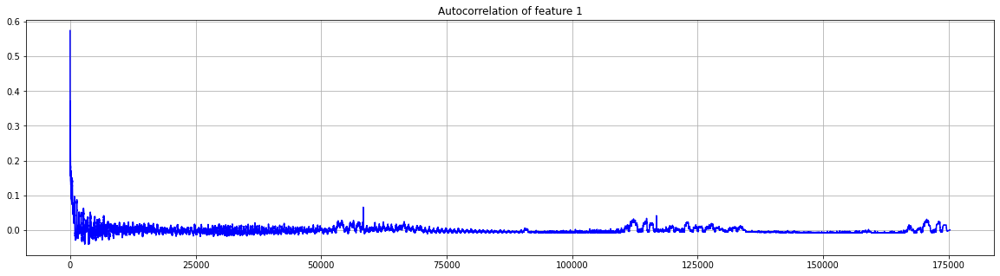

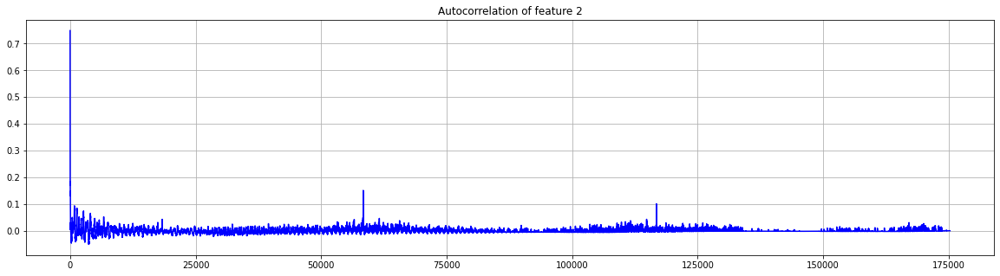

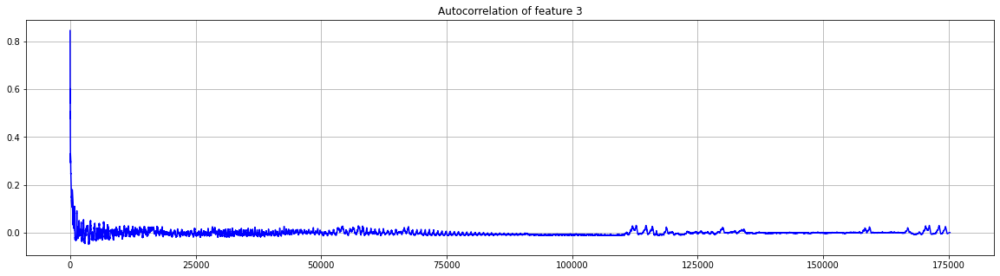

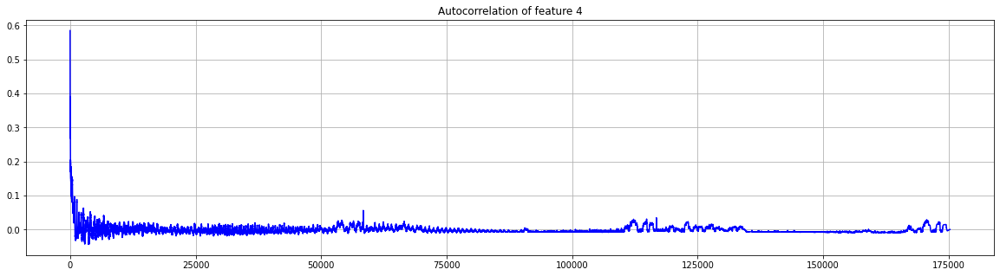

...

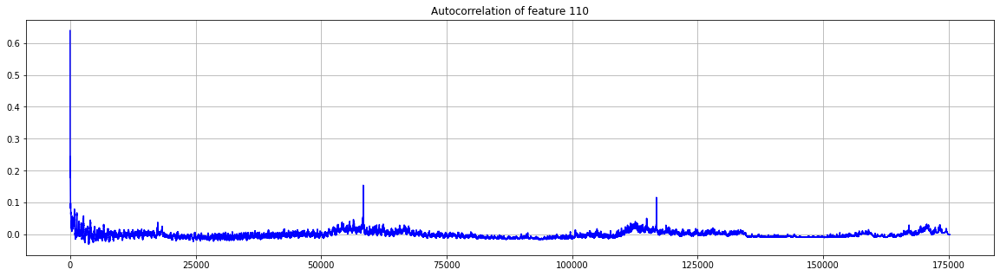

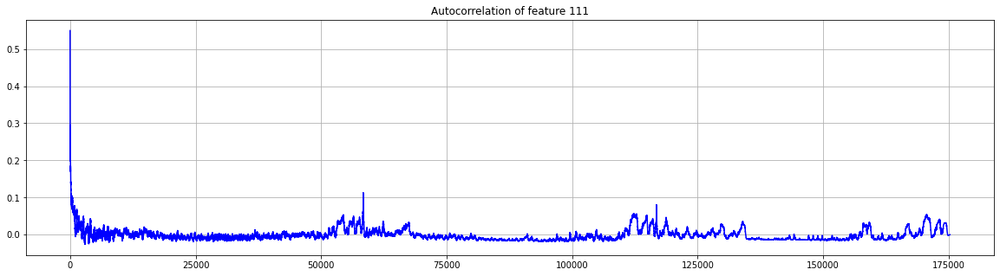

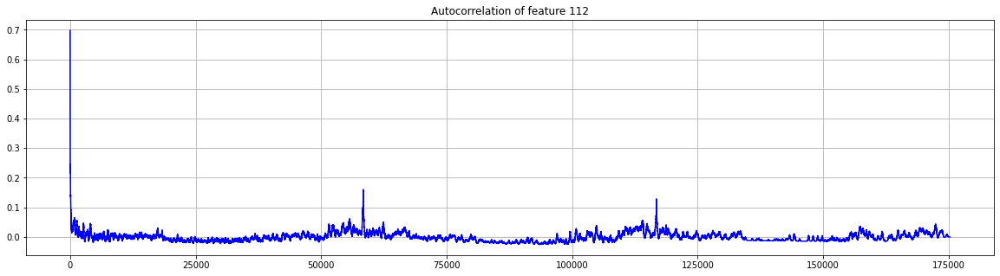

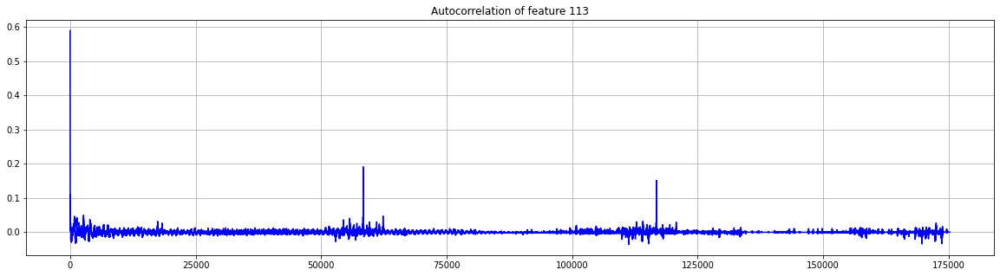

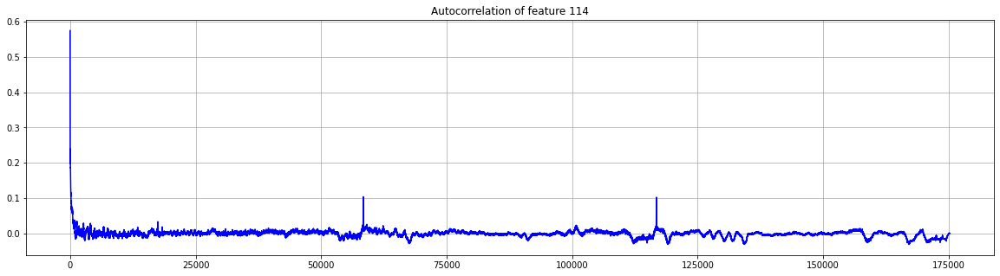

In [24]:
for feature_id in range(115):
    fig, ax = plt.subplots(figsize=(20, 5))
    ax.set_title("Autocorrelation of feature {}".format(feature_id))
    ax.plot(acfs[feature_id][1:], color=color_features)
    ax.grid()
    plt.show()

In [25]:
mean_abs_acf = np.mean(np.abs(np.array(acfs)), axis=0)

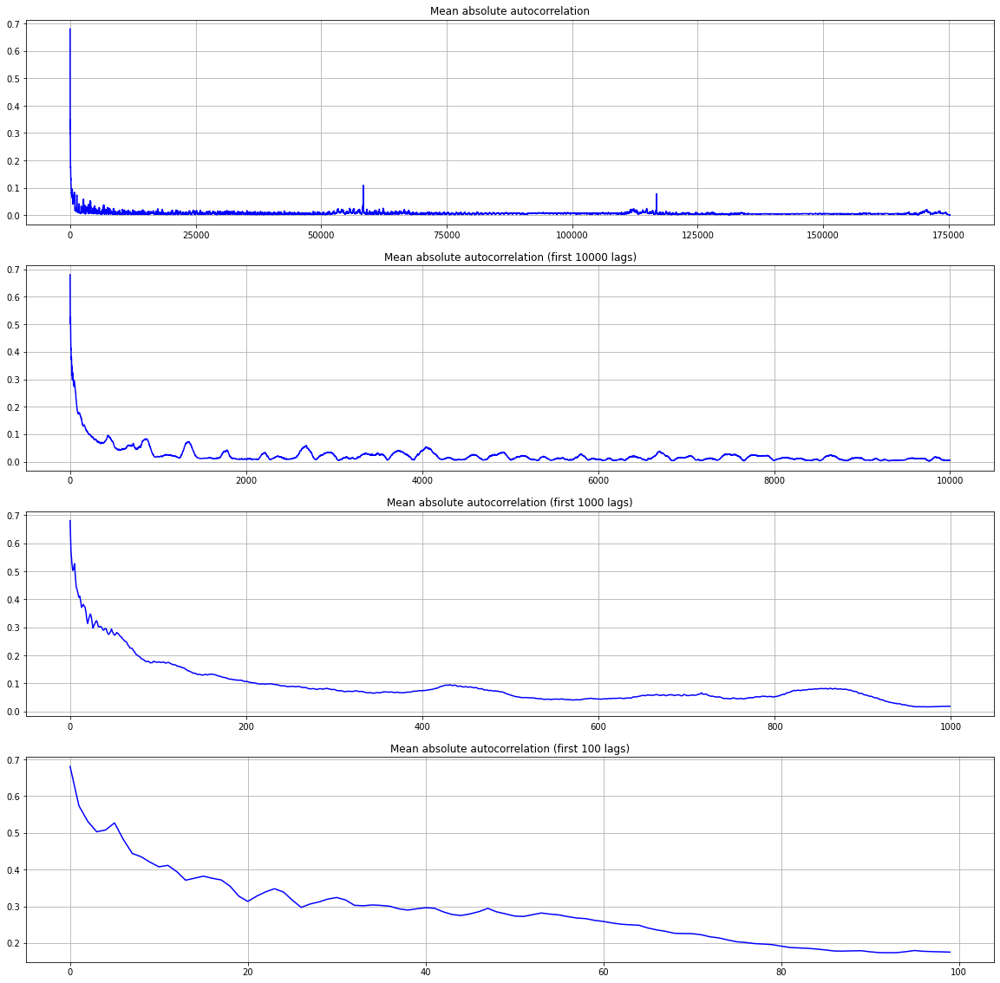

In [26]:
fig, axs = plt.subplots(4, figsize=(20, 20))
axs[0].set_title("Mean absolute autocorrelation")
axs[0].plot(mean_abs_acf[1:], color=color_features)
axs[0].grid()

axs[1].set_title("Mean absolute autocorrelation (first 10000 lags)")
axs[1].plot(mean_abs_acf[1:10001], color=color_features)
axs[1].grid()

axs[2].set_title("Mean absolute autocorrelation (first 1000 lags)")
axs[2].plot(mean_abs_acf[1:1001], color=color_features)
axs[2].grid()

axs[3].set_title("Mean absolute autocorrelation (first 100 lags)")
axs[3].plot(mean_abs_acf[1:101], color=color_features)
axs[3].grid()
plt.show()

When considering only benign data, it seems that the problem is much smaller. With a large enough portion of unused data between train and test data, it should be alright.